In [5]:
import pandas as pd
import numpy as np

from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from scipy import stats
from scipy.stats import norm
from scipy.special import boxcox1p

from pandas_profiling import ProfileReport#conda install -c conda-forge pandas-profiling - https://github.com/pandas-profiling/pandas-profiling

In [6]:
#Read the CSV file into a dataframe
train = pd.read_csv('Dataset/train.csv')
test = pd.read_csv('Dataset/test.csv')

In [7]:
#Concatenate train and test sets into one
test["SalePrice"] = np.nan
ntrain = train.shape[0]
ntest = test.shape[0]
#sales_Prices = pd.DataFrame(columns =['SalePrice'])
#sales_Prices['SalePrice'] = train.SalePrice.values
all_data = pd.concat((train, test)).reset_index(drop=True)
#all_data.drop(['SalePrice'], axis=1, inplace=True)
print("all_data size is : {}".format(all_data.shape))

all_data size is : (2919, 81)


In [8]:
profile = ProfileReport(all_data, title="House Prices Data")

In [9]:
profile.to_file("HousePrices_report.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


MSSubclass describe the type of dwelling, even though it is a numerical value this should be categorical.

In [10]:
all_data['MSSubClass'] = all_data['MSSubClass'].astype('object')

Create new attribute, TotalSF - Total internal square footage of the property

Create new binary attributes to define if the property has 1st and or 2nd floors 

In [11]:
all_data['TotalSF'] = all_data['GrLivArea'] + all_data['TotalBsmtSF']

all_data['Has_1stFlr'] = np.where(all_data['1stFlrSF'] > 0, 1, 0)
all_data.drop(['1stFlrSF'], axis=1, inplace=True)


all_data['Has_2ndFlr'] = np.where(all_data['2ndFlrSF'] > 0, 1, 0)
all_data.drop(['2ndFlrSF'], axis=1, inplace=True)

all_data.drop(['TotalBsmtSF'], axis=1, inplace=True)
all_data.drop(['GrLivArea'], axis=1, inplace=True)

Remove attributes where missing values greater than 15%: -

Alley, Fence, FireplaceQu, LotFrontage, MiscFeatures, PoolQC

In [12]:
all_data.drop(['Alley'], axis=1, inplace=True)
all_data.drop(['Fence'], axis=1, inplace=True)
all_data.drop(['FireplaceQu'], axis=1, inplace=True)
all_data.drop(['LotFrontage'], axis=1, inplace=True)
all_data.drop(['MiscFeature'], axis=1, inplace=True)
all_data.drop(['PoolQC'], axis=1, inplace=True)

Create a new attribute showing total porch square footage and remove the seperate attributes.

Create binary attributes to define if the property has any of these features 

In [13]:
all_data['Has_3SsnPorch'] = np.where(all_data['3SsnPorch'] > 0, 1, 0)
all_data['Has_EnclosedPorch'] = np.where(all_data['EnclosedPorch'] > 0, 1, 0)
all_data['Has_OpenPorch'] = np.where(all_data['OpenPorchSF'] > 0, 1, 0)
all_data['Has_ScreenPorch'] = np.where(all_data['ScreenPorch'] > 0, 1, 0)
all_data['Has_WoodDeck'] = np.where(all_data['WoodDeckSF'] > 0, 1, 0)

all_data['PorchSF'] = all_data['3SsnPorch'] + all_data['EnclosedPorch'] + all_data['OpenPorchSF']  + all_data['ScreenPorch'] + all_data['WoodDeckSF']

all_data.drop(['3SsnPorch'], axis=1, inplace=True)
all_data.drop(['EnclosedPorch'], axis=1, inplace=True)
all_data.drop(['OpenPorchSF'], axis=1, inplace=True)
all_data.drop(['ScreenPorch'], axis=1, inplace=True)
all_data.drop(['WoodDeckSF'], axis=1, inplace=True)

Handling attributes with high percentage of zeros.
For the following attributes, instead of the square footage of a feature will create a new binary attribute to show if the feature exists or not: -

GarageArea, MasVnrArea, PoolArea, MiscVal

In [14]:
all_data['Has_PoolArea'] = np.where(all_data['PoolArea'] > 0, 1, 0)
all_data.drop(['PoolArea'], axis=1, inplace=True)


all_data['Has_Garage'] = np.where(all_data['GarageArea'] > 0, 1, 0)
all_data.drop(['GarageArea'], axis=1, inplace=True)

all_data['Has_MasonaryVeneer'] = np.where(all_data['MasVnrArea'] > 0, 1, 0)
all_data.drop(['MasVnrArea'], axis=1, inplace=True)

all_data['Has_MiscVal'] = np.where(all_data['MiscVal'] > 0, 1, 0)
all_data.drop(['MiscVal'], axis=1, inplace=True)

Removing all attributes related to the size of the Basement of the property other than TotalBsmtSF. Also dropping the LowQualFinSF attribute.

In [15]:
all_data.drop(['BsmtFinSF1'], axis=1, inplace=True)
all_data.drop(['BsmtUnfSF'], axis=1, inplace=True)
all_data.drop(['BsmtFinSF2'], axis=1, inplace=True)
all_data.drop(['LowQualFinSF'], axis=1, inplace=True)

There are currently 4 attributes that describe the number of bathrooms in a property, going to create a single attribute with the total number of bathrooms and remove the four original attributes.

In [16]:
all_data['TotalBathrooms'] = all_data['BsmtFullBath'] + all_data['BsmtHalfBath'] + all_data['FullBath'] + all_data['HalfBath']

all_data.drop(['BsmtFullBath'], axis=1, inplace=True)

all_data.drop(['BsmtHalfBath'], axis=1, inplace=True)

all_data.drop(['FullBath'], axis=1, inplace=True)

all_data.drop(['HalfBath'], axis=1, inplace=True)


Check for any more missing values

In [17]:
all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:30]
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data.head(30)

,Missing Ratio
SalePrice,49.982871
GarageCond,5.447071
GarageQual,5.447071
GarageFinish,5.447071
GarageYrBlt,5.447071
GarageType,5.378554
BsmtCond,2.809181
BsmtExposure,2.809181
BsmtQual,2.774923
BsmtFinType2,2.740665


Numeric attributes, GarageYrBlt and GarageCars, can assume that missing values mean that there is no garage so will fill these with 0 

In [18]:
all_data['GarageYrBlt'].fillna(0, inplace=True)
all_data['GarageCars'].fillna(0, inplace=True)

Checking missing value in TotalBathrooms

In [19]:
all_data['TotalBathrooms'].describe()

count    2917.000000
mean        2.439150
std         0.941799
min         1.000000
25%         2.000000
50%         2.000000
75%         3.000000
max         8.000000
Name: TotalBathrooms, dtype: float64

Replacing missing values with the median (2)

In [20]:
all_data['TotalBathrooms'].fillna(2, inplace=True)

Checking missing values in TotalSF

In [21]:
all_data['TotalSF'].describe()

count     2918.000000
mean      2552.744688
std        805.573186
min        334.000000
25%       2004.250000
50%       2453.000000
75%       2996.000000
max      11752.000000
Name: TotalSF, dtype: float64

Replacing missing values with the median (2453)

In [22]:
all_data['TotalSF'].fillna(2453, inplace=True)

Attributes with remaining missing values, where applicable use NA or None if this isn't the case then use the value in the attribute with the highest count: -

GarageCond, GarageFinish, GarageQual, GarageType, BsmtExposure, BsmtCond, BsmtFinType2, BsmtFinType1, BsmtQual
MasVnrType, MSZoning, Functional, Utilities, KitchenQual, SaleType, Exterior2nd, 
Exterior1st, Electrical	

In [23]:
all_data.GarageCond[all_data.GarageCond.isnull() == True] = 'NA'
all_data.GarageFinish[all_data.GarageFinish.isnull() == True] = 'NA'
all_data.GarageQual[all_data.GarageQual.isnull() == True] = 'NA'
all_data.GarageType[all_data.GarageType.isnull() == True] = 'NA'

all_data.BsmtExposure[all_data.BsmtExposure.isnull() == True] = 'NA'
all_data.BsmtCond[all_data.BsmtCond.isnull() == True] = 'NA'
all_data.BsmtFinType2[all_data.BsmtFinType2.isnull() == True] = 'NA'
all_data.BsmtFinType1[all_data.BsmtFinType1.isnull() == True] = 'NA'
all_data.BsmtQual[all_data.BsmtQual.isnull() == True] = 'NA'

all_data.MasVnrType[all_data.MasVnrType.isnull() == True] = 'None'
all_data.Functional[all_data.MasVnrType.isnull() == True] = 'Typ'
all_data['Functional'].fillna('Typ', inplace=True)
all_data.Utilities[all_data.MasVnrType.isnull() == True] = 'AllPub'
all_data['Utilities'].fillna('AllPub', inplace=True)
all_data.KitchenQual[all_data.MasVnrType.isnull() == True] = 'TA'
all_data['KitchenQual'].fillna('TA', inplace=True)
all_data.Electrical[all_data.Electrical.isnull() == True] = 'SBrkr'
all_data.MSZoning[all_data.MSZoning.isnull() == True] = 'RL'
all_data.SaleType[all_data.SaleType.isnull() == True] = 'WD'
all_data.Exterior2nd[all_data.Exterior2nd.isnull() == True] = 'VinylSd'
all_data.Exterior1st[all_data.Exterior1st.isnull() == True] = 'VinylSd'


Check for Positive Skewness and then handle attributes: - 

TotalSF & LotArea 

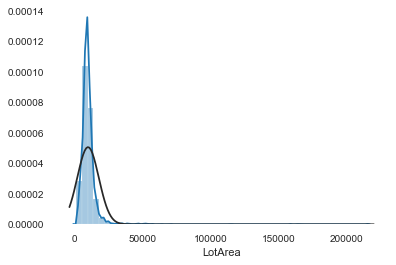

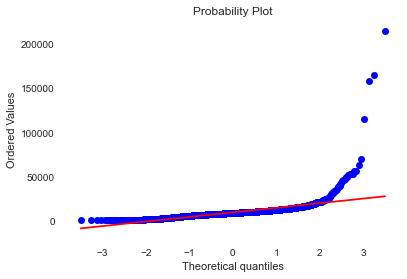

In [24]:
#histogram and normal probability plot
sns.distplot(all_data['LotArea'], fit=norm);
fig = plt.figure()
res = stats.probplot(all_data['LotArea'], plot=plt)

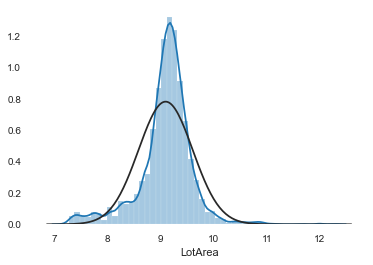

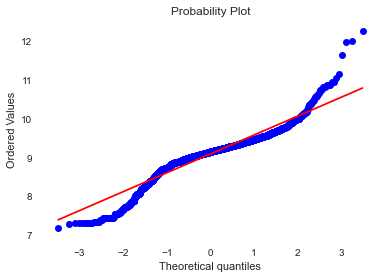

In [25]:
#applying log transformation
all_data['LotArea'] = np.log1p(all_data['LotArea'])

#transformed histogram and normal probability plot
sns.distplot(all_data['LotArea'], fit=norm);
fig = plt.figure()
res = stats.probplot(all_data['LotArea'], plot=plt)

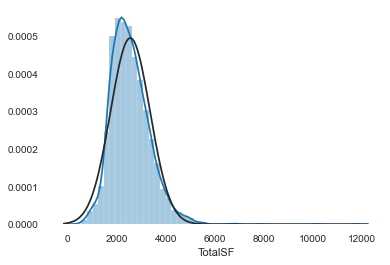

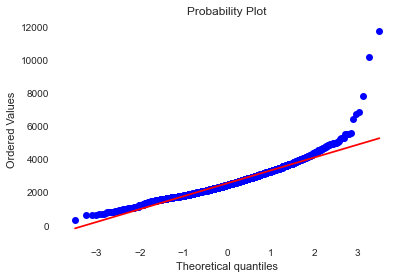

In [26]:
#histogram and normal probability plot
sns.distplot(all_data['TotalSF'], fit=norm);
fig = plt.figure()
res = stats.probplot(all_data['TotalSF'], plot=plt)

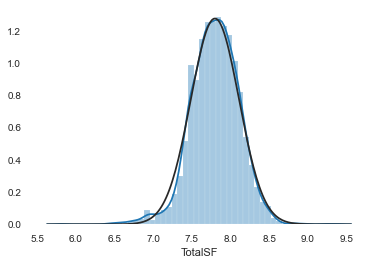

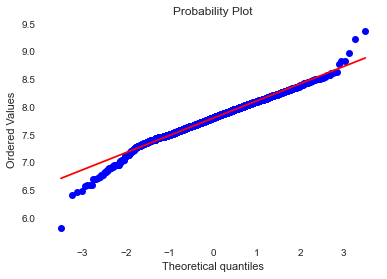

In [27]:
#applying log transformation
all_data['TotalSF'] = np.log1p(all_data['TotalSF'])

#transformed histogram and normal probability plot
sns.distplot(all_data['TotalSF'], fit=norm);
fig = plt.figure()
res = stats.probplot(all_data['TotalSF'], plot=plt)

Look at the correlation of the numerical attributes

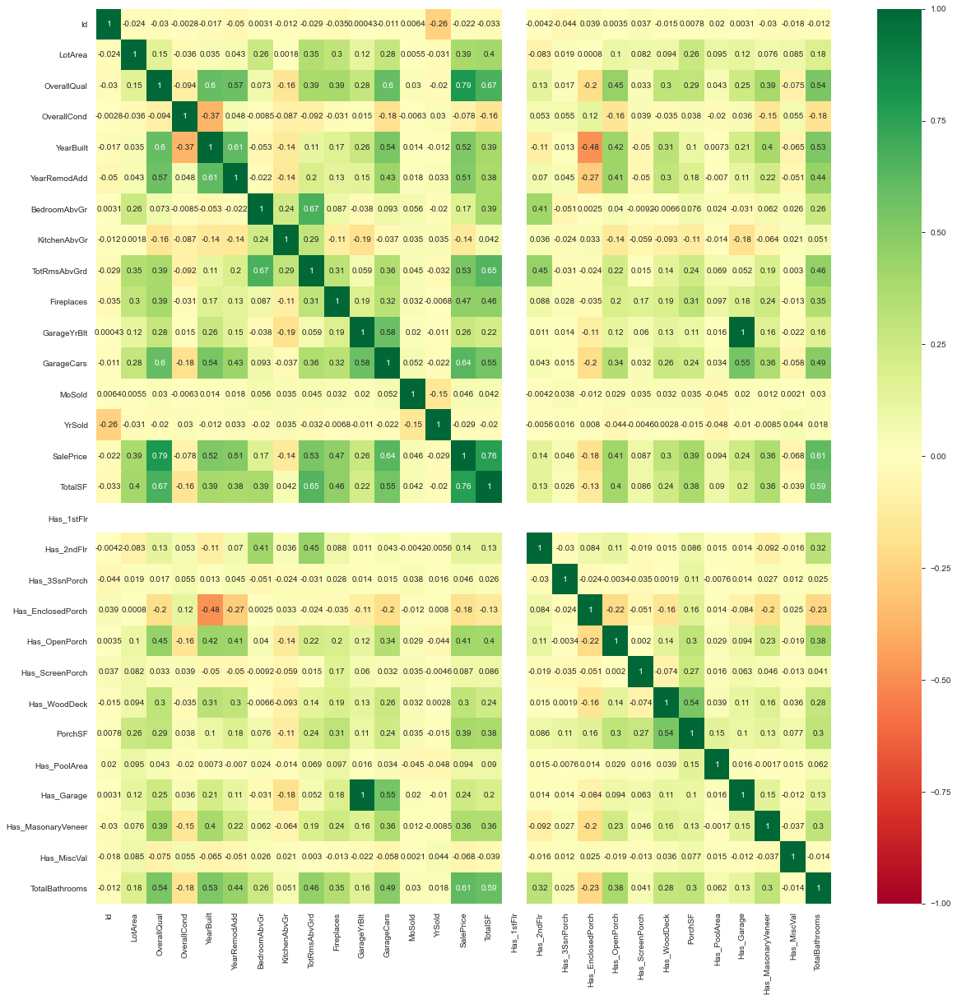

In [28]:
corr_matrix = all_data.corr()

plt.figure (figsize=(20,20))
sns.heatmap(corr_matrix, cmap='RdYlGn', vmin=-1, annot=True)

In [29]:
all_data['Has_1stFlr'].describe()

count    2919.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
Name: Has_1stFlr, dtype: float64

Dropping Has_1stFlr as all columns have a value of one (1)

In [30]:
all_data.drop(['Has_1stFlr'], axis=1, inplace=True)

Strong (1) correlation between GarageYrBlt and Has_Garage, will remove GarageYrBlt.

In [31]:
all_data.drop(['GarageYrBlt'], axis=1, inplace=True)

In [32]:
# defining a function to plot boxplot and stripplot for non continuous variables
def make_attrib_plot(feature, rotation1, rotation2):
    fig = plt.figure(figsize=(20,8))
    gs = GridSpec(1,2)
    sns.boxplot(y=all_data.SalePrice, x=all_data[feature], ax=fig.add_subplot(gs[0,0]))
    plt.xticks(rotation = rotation1)
    sns.stripplot(y=all_data.SalePrice, x=all_data[feature], ax=fig.add_subplot(gs[0,1]))
    plt.xticks(rotation = rotation2)
    fig.show()

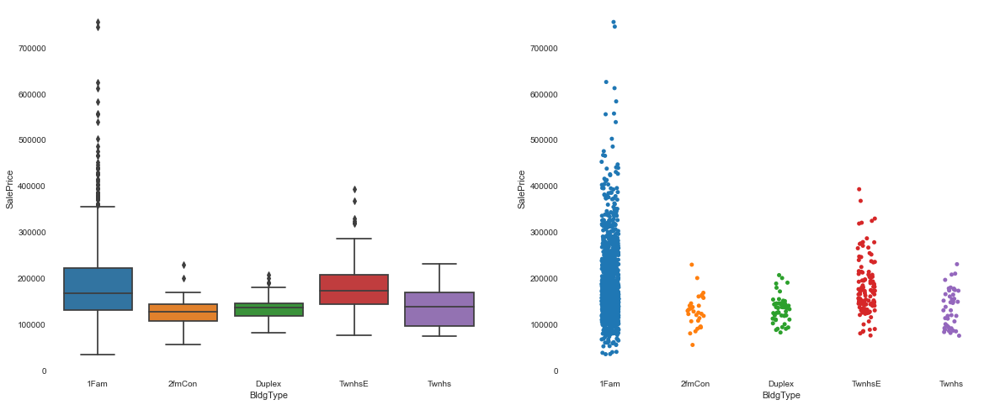

In [33]:
make_attrib_plot("BldgType",0,0)

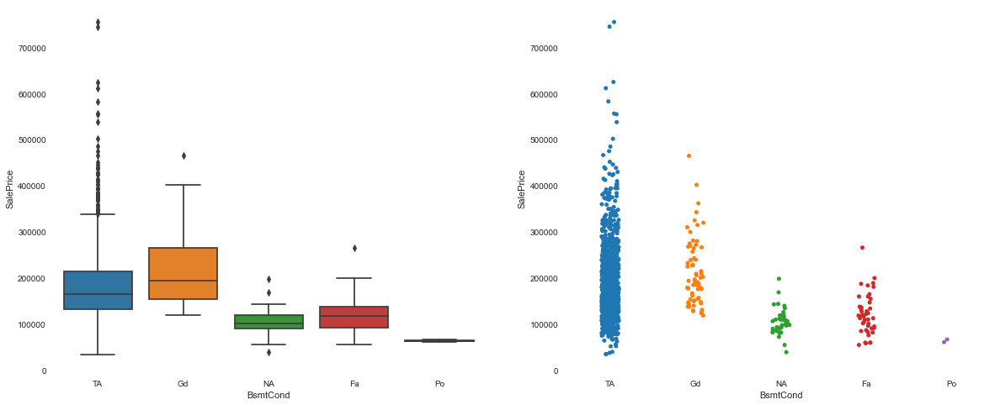

In [34]:
make_attrib_plot("BsmtCond",0,0)

In [35]:
# few values = Po, so I'll decide to put together with Fa
all_data.BsmtCond = all_data.BsmtCond.apply(lambda x: 'Fa' if x == 'Po' else x)

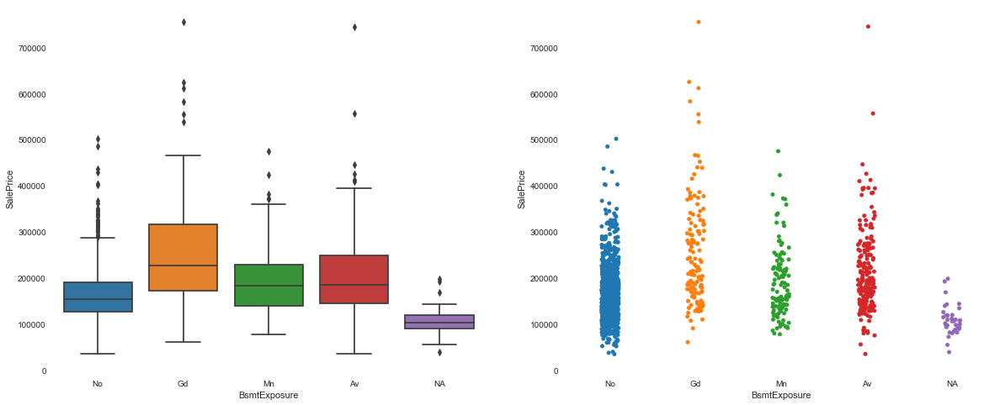

In [36]:
make_attrib_plot("BsmtExposure",0,0)

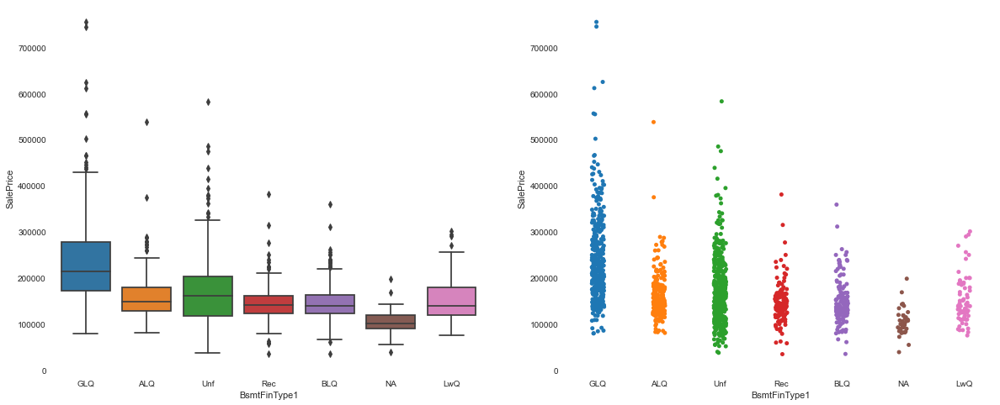

In [37]:
make_attrib_plot("BsmtFinType1",0,0)

One Hot Encode Categorical Data 

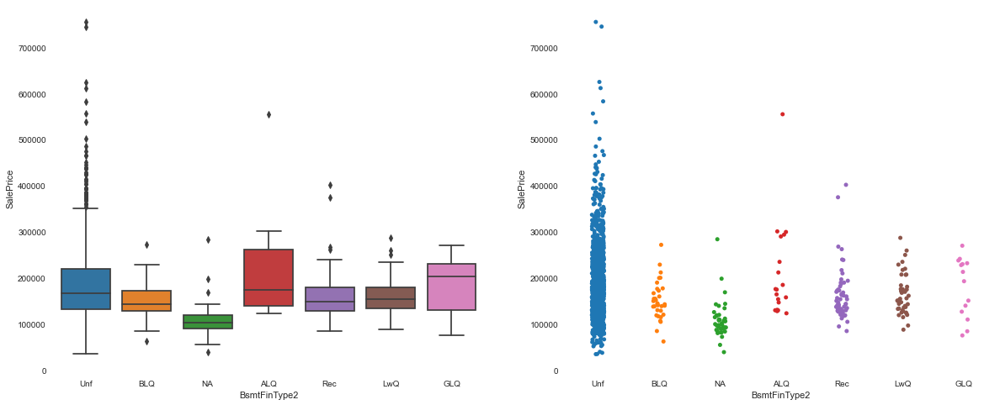

In [38]:
make_attrib_plot("BsmtFinType2",0,0)

In [39]:
# few values in any other category othe than Unf. Will create Other to contain all other samples.
all_data.BsmtFinType2 = all_data.BsmtFinType2.apply(lambda x: 'Other' if x != 'Unf' else x)

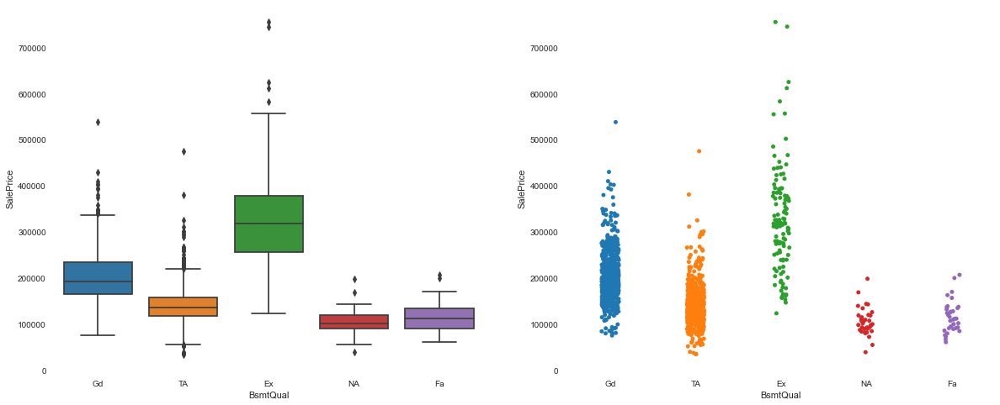

In [40]:
make_attrib_plot("BsmtQual",0,0)

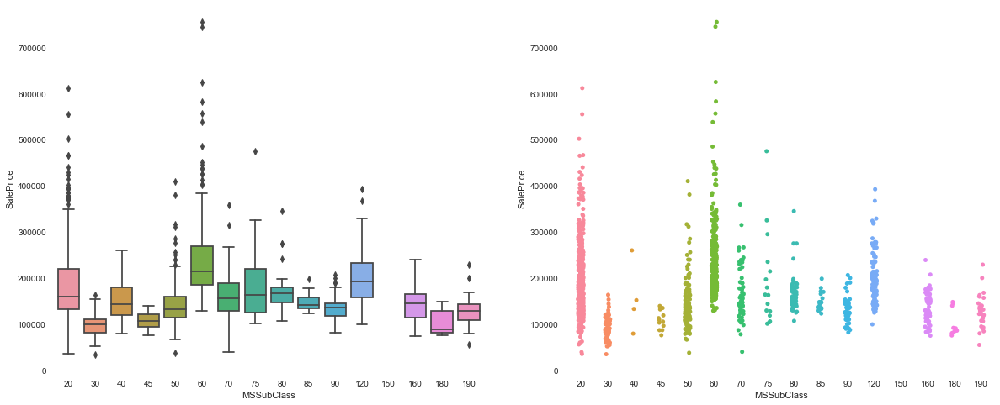

In [41]:
make_attrib_plot("MSSubClass",0,0)

As this describes the type of the property in more detail than the BldgType attribute, will drop BldgType

In [42]:
all_data.drop(['BldgType'], axis=1, inplace=True)

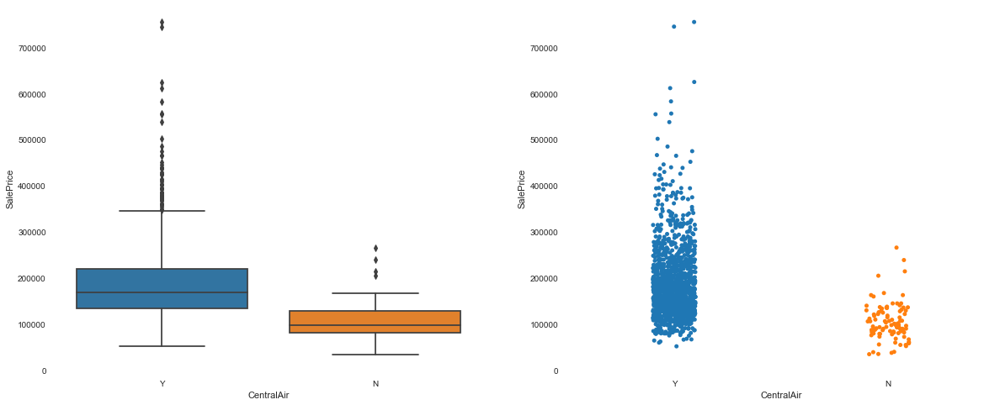

In [43]:
make_attrib_plot("CentralAir",0,0)

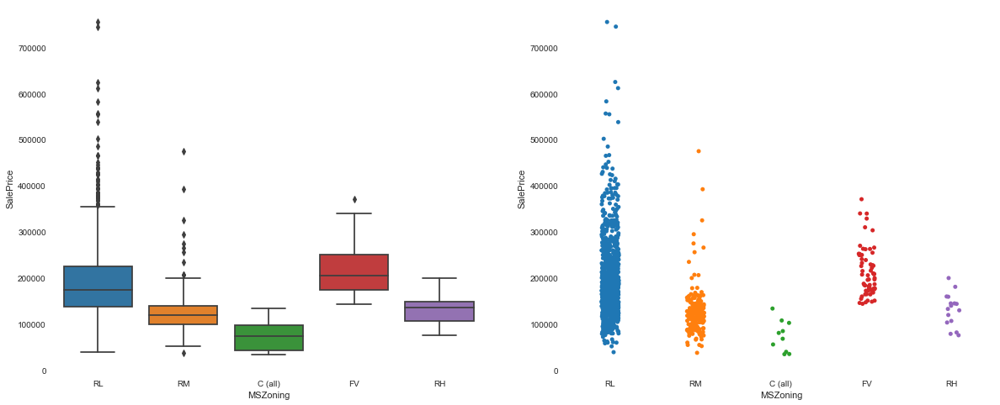

In [44]:
make_attrib_plot("MSZoning",0,0)

In [45]:
# Combining all Residential zones, RL, RM & RH
all_data.MSZoning = all_data.MSZoning.apply(lambda x: 'R' if x == 'RL' else x)
all_data.MSZoning = all_data.MSZoning.apply(lambda x: 'R' if x == 'RM' else x)
all_data.MSZoning = all_data.MSZoning.apply(lambda x: 'R' if x == 'RH' else x)

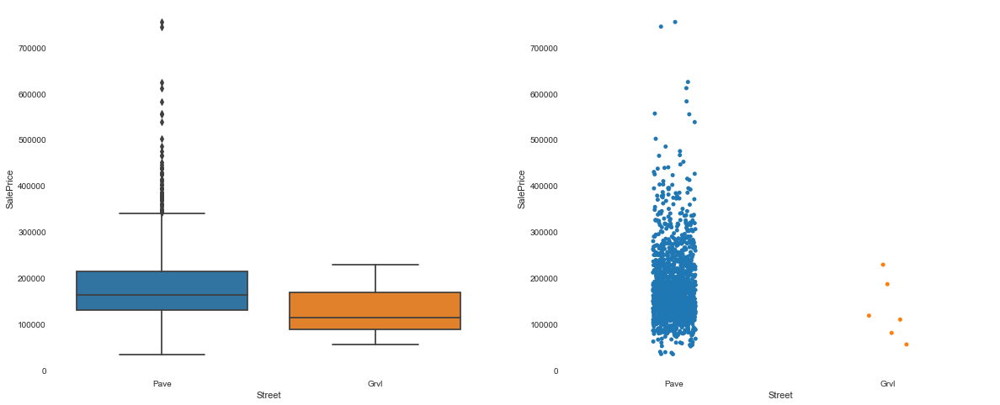

In [46]:
make_attrib_plot("Street",0,0)

As there are so few values in the Grvl Category, dropping this attribute

In [47]:
all_data.drop(['Street'], axis=1, inplace=True)

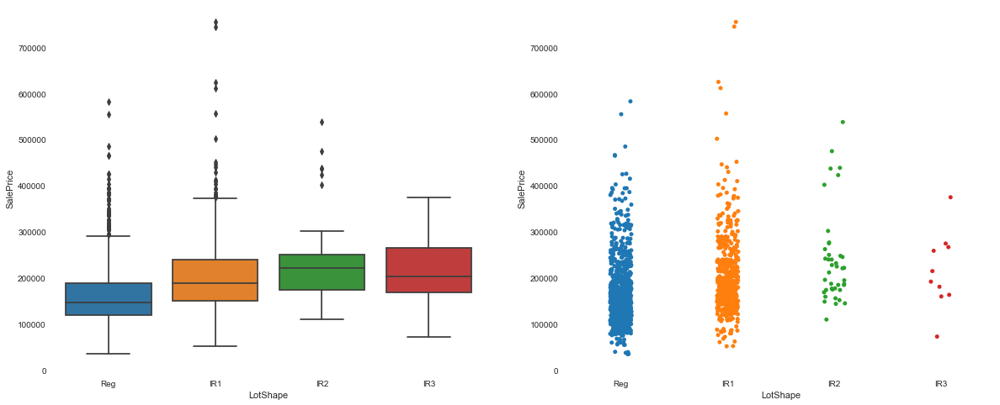

In [48]:
make_attrib_plot("LotShape",0,0)

Combining IR2 and IR3 into Other

In [49]:
# Combining IR2 and IR3 into Other
all_data.LotShape = all_data.LotShape.apply(lambda x: 'Other' if x == 'IR2' else x)
all_data.LotShape = all_data.LotShape.apply(lambda x: 'Other' if x == 'IR3' else x)

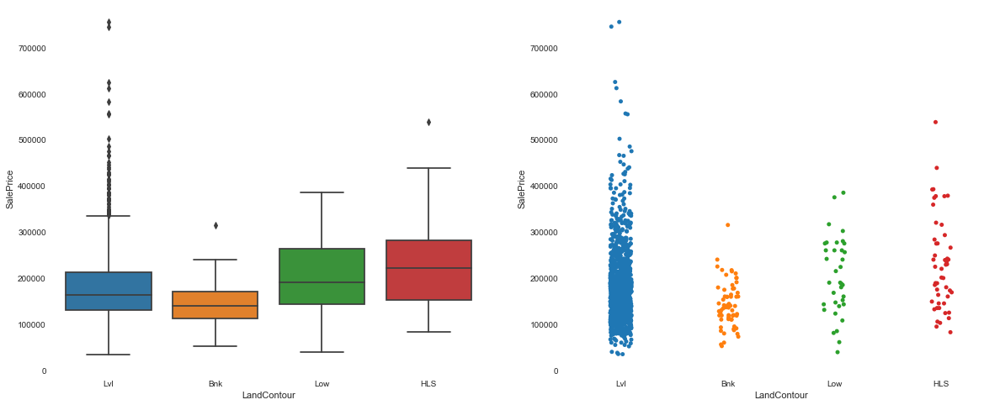

In [50]:
make_attrib_plot("LandContour",0,0)

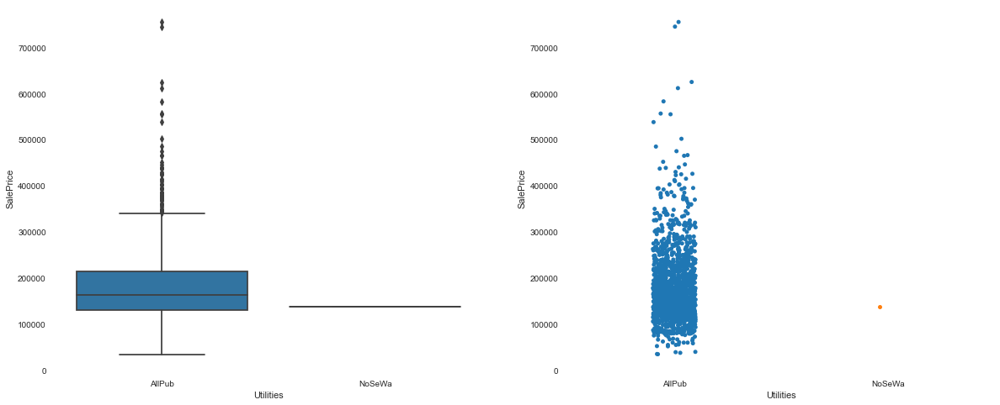

In [51]:
make_attrib_plot("Utilities",0,0)

Dropping Utilities due to there being only a single point in the NoSeWa category

In [52]:
all_data.drop(['Utilities'], axis=1, inplace=True)

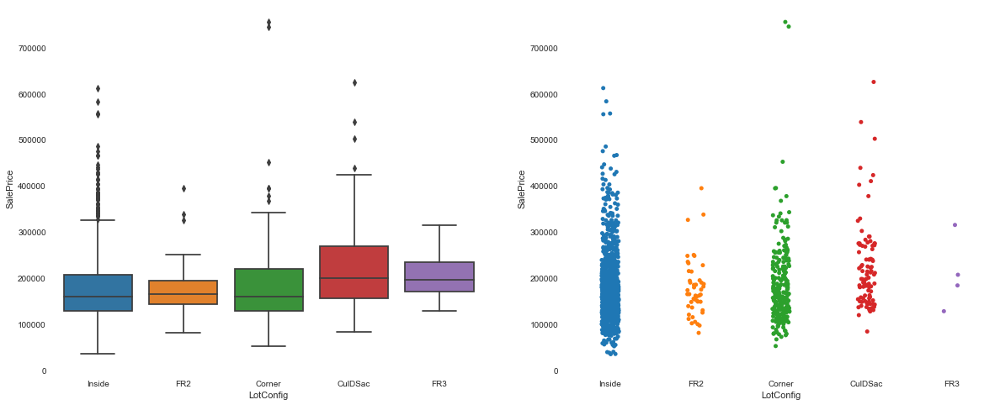

In [53]:
make_attrib_plot("LotConfig",0,0)

Combining FR2 and FR3

In [54]:
# Combining FR2 and FR3 into F
all_data.LotConfig = all_data.LotConfig.apply(lambda x: 'F' if x == 'FR2' else x)
all_data.LotConfig = all_data.LotConfig.apply(lambda x: 'F' if x == 'FR3' else x)

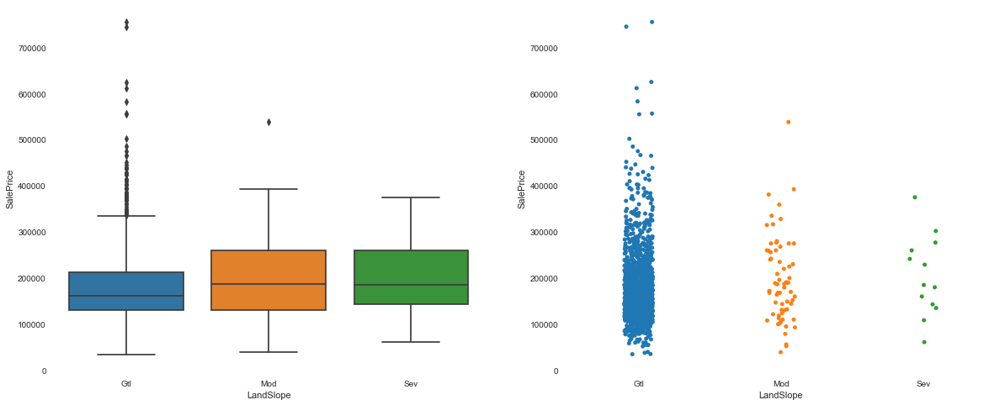

In [55]:
make_attrib_plot("LandSlope",0,0)

As there is already an attribute that describes the land that the property is sitting on (LandContour) with more of a significance to SalePrice, dropping LandSlope

In [56]:
all_data.drop(['LandSlope'], axis=1, inplace=True)

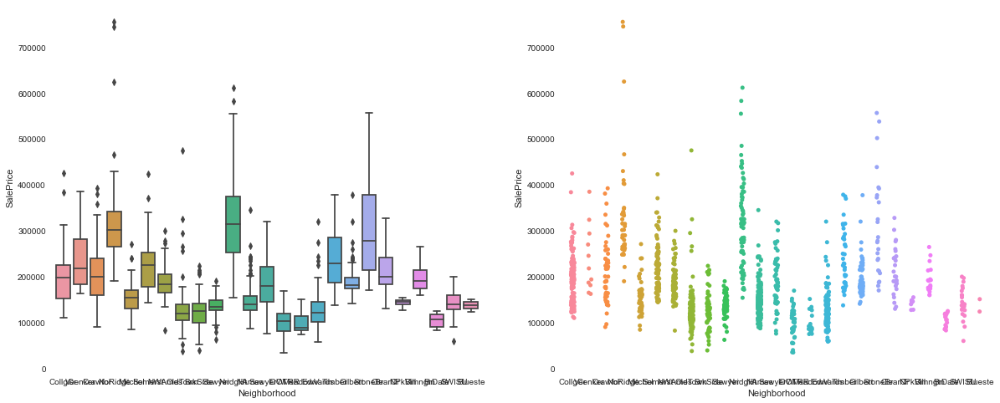

In [57]:
make_attrib_plot("Neighborhood",0,0)

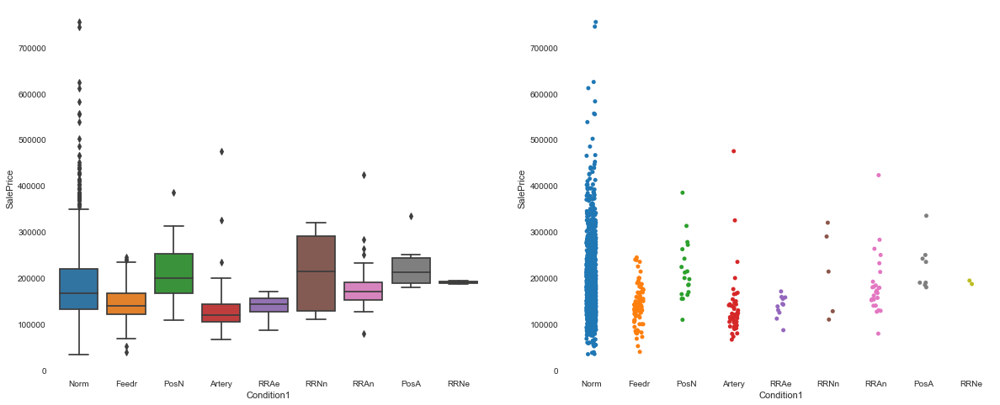

In [58]:
make_attrib_plot("Condition1",0,0)

Combining RRx and Posx attributes

In [59]:
# combining RR attributes
all_data.Condition1 = all_data.Condition1.apply(lambda x: 'RR' if x == 'RRNn' else x)
all_data.Condition1 = all_data.Condition1.apply(lambda x: 'RR' if x == 'RRAn' else x)
all_data.Condition1 = all_data.Condition1.apply(lambda x: 'RR' if x == 'RRNe' else x)
all_data.Condition1 = all_data.Condition1.apply(lambda x: 'RR' if x == 'RRAe' else x)

# combining Pos attributes
all_data.Condition1 = all_data.Condition1.apply(lambda x: 'Pos' if x == 'PosN' else x)
all_data.Condition1 = all_data.Condition1.apply(lambda x: 'Pos' if x == 'PosA' else x)

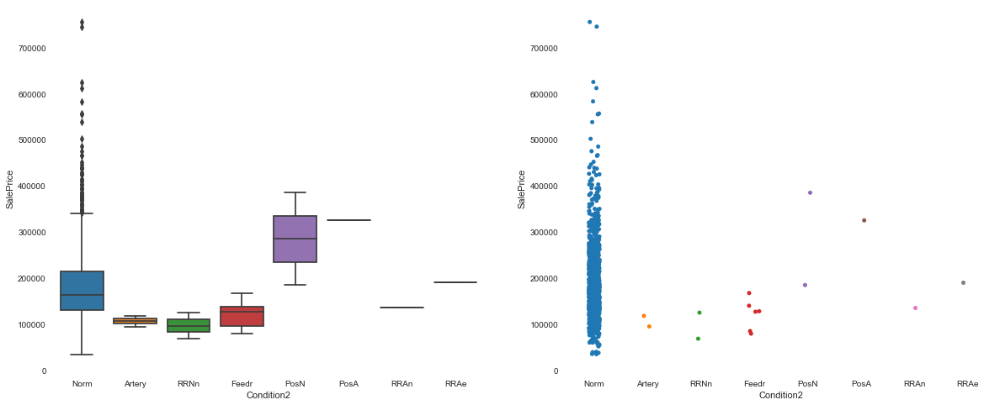

In [60]:
make_attrib_plot("Condition2",0,0)

Dropping Condition2 due to the majority of the data is all in Norm

In [61]:
all_data.drop(['Condition2'], axis=1, inplace=True)

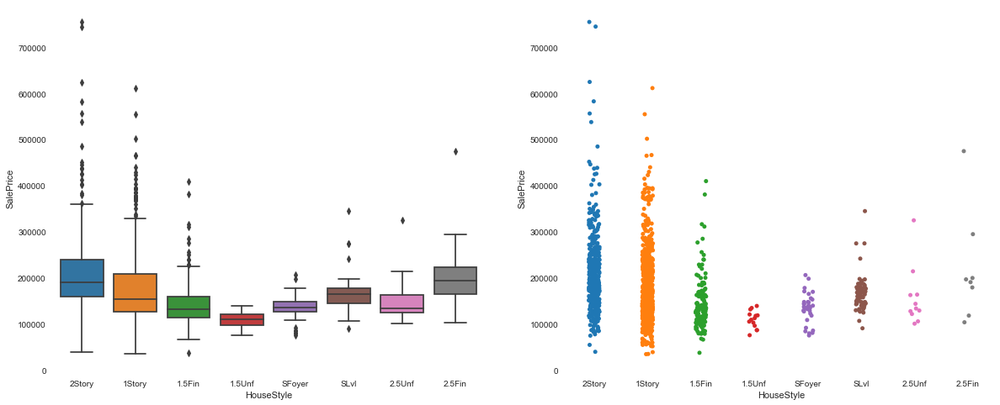

In [62]:
make_attrib_plot("HouseStyle",0,0)

Removing this as this appears to replicate data held in MSSubClass

In [63]:
all_data.drop(['HouseStyle'], axis=1, inplace=True)

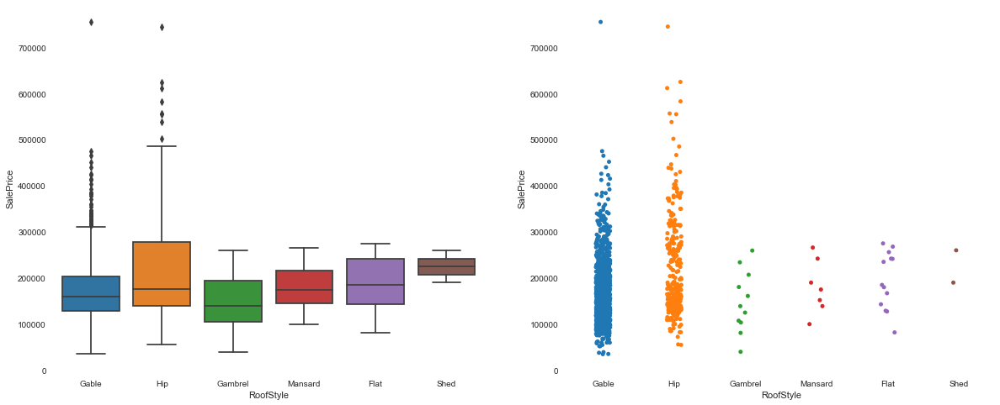

In [64]:
make_attrib_plot("RoofStyle",0,0)

Combining all other categories except Gable and Hip into Other

In [65]:
# combining attributes
all_data.RoofStyle = all_data.RoofStyle.apply(lambda x: 'Other' if x == 'Flat' else x)
all_data.RoofStyle = all_data.RoofStyle.apply(lambda x: 'Other' if x == 'Shed' else x)
all_data.RoofStyle = all_data.RoofStyle.apply(lambda x: 'Other' if x == 'Mansard' else x)
all_data.RoofStyle = all_data.RoofStyle.apply(lambda x: 'Other' if x == 'Gambrel' else x)

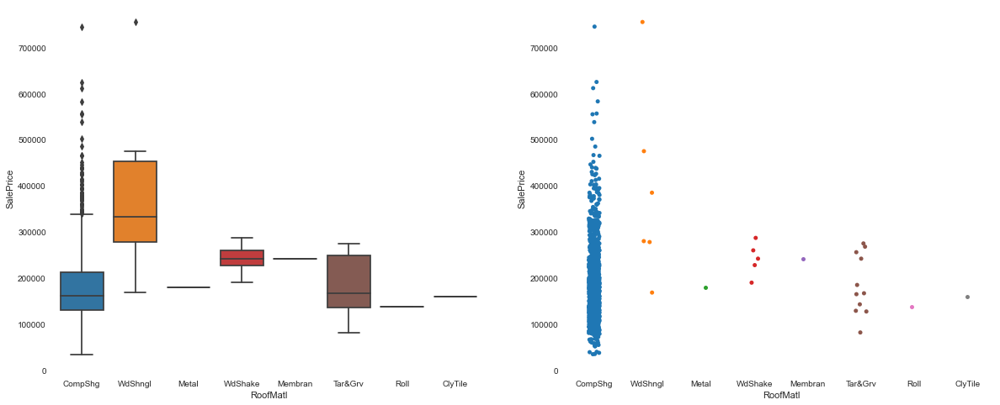

In [66]:
make_attrib_plot("RoofMatl",0,0)

Dropping this attribute due to the majority of the data is in a single category

In [67]:
all_data.drop(['RoofMatl'], axis=1, inplace=True)

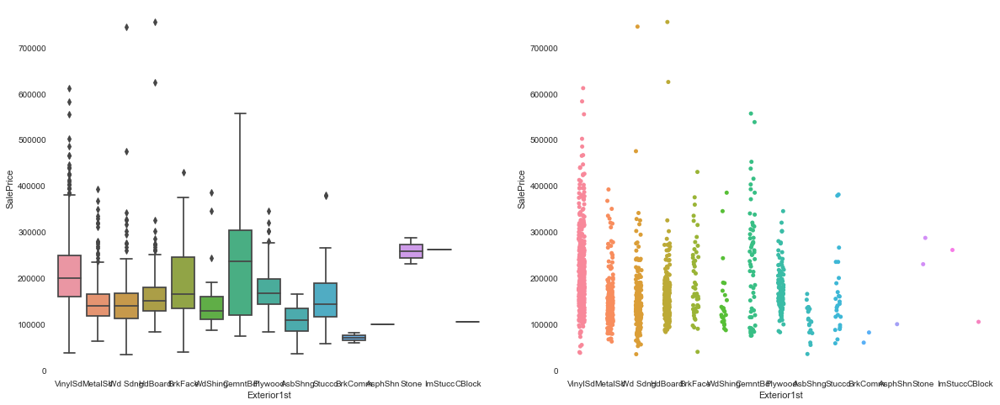

In [68]:
make_attrib_plot("Exterior1st",0,0)

In [69]:
# few values from BrkComm to CBlock, so put together = Other
all_data.Exterior1st = all_data.Exterior1st.apply(lambda x: 'Other' if (x == 'BrkComm' or x == 'AsphShn' or x == 'Stone' 
                                                                      or x == 'ImStucc' or x== 'CBlock') else x)

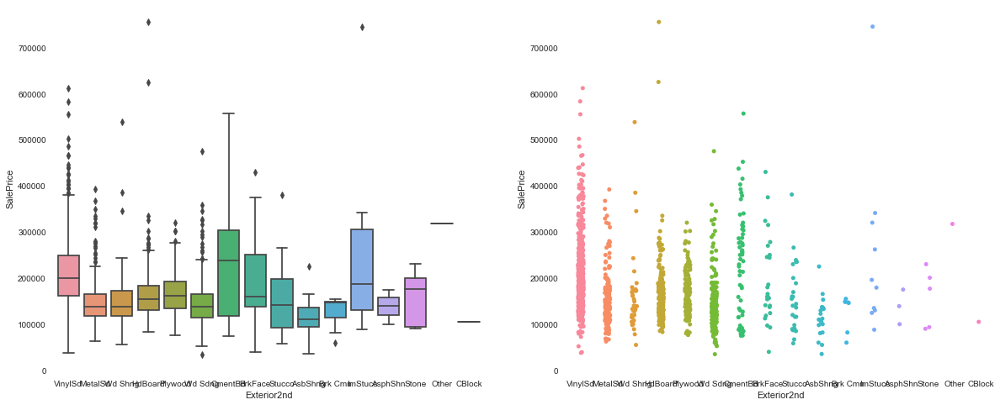

In [70]:
make_attrib_plot("Exterior2nd",0,0)

In [71]:
# few values from BrkComm to CBlock, so put together = Other
all_data.Exterior2nd = all_data.Exterior2nd.apply(lambda x: 'Other' if (x == 'BrkComm' or x == 'AsphShn' or x == 'Stone' 
                                                                      or x == 'ImStucc' or x== 'CBlock') else x)

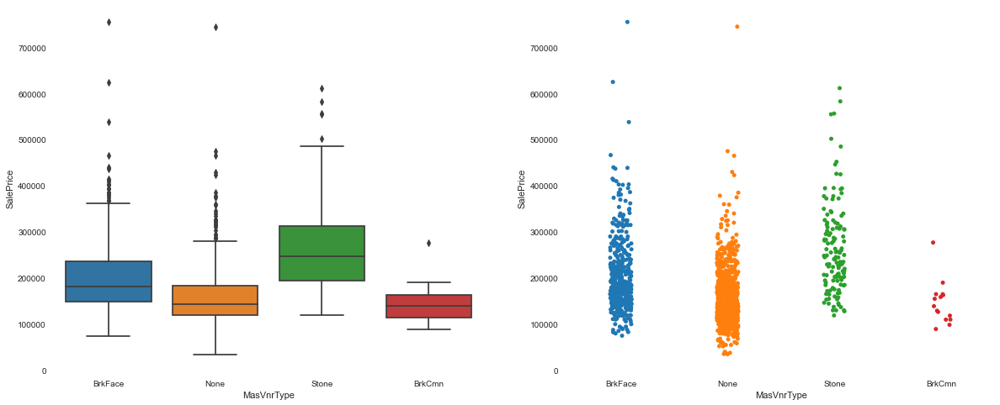

In [72]:
make_attrib_plot("MasVnrType",0,0)

In [73]:
# Combining BrkCmn and BrkFace = Brk
all_data.MasVnrType = all_data.MasVnrType.apply(lambda x: 'Brk' if (x == 'BrkCmn' or x == 'BrkFace') else x)

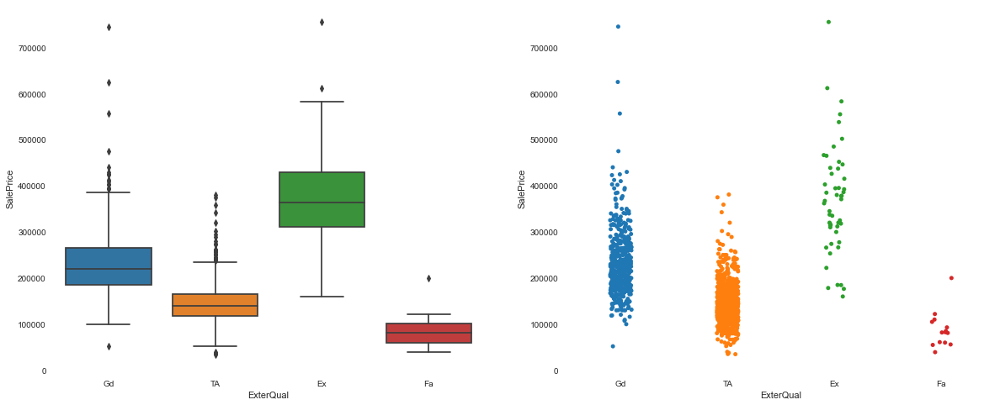

In [74]:
make_attrib_plot("ExterQual",0,0)

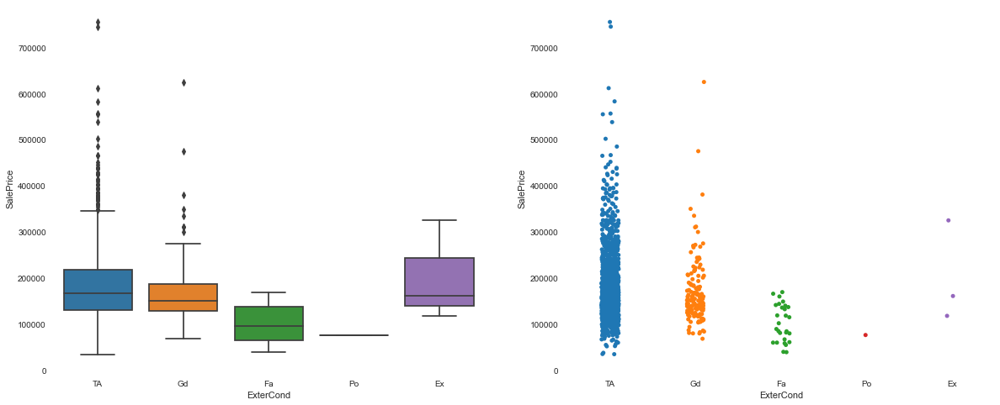

In [75]:
make_attrib_plot("ExterCond",0,0)

Dropping ExterCond as already have ExterQual

In [76]:
all_data.drop(['ExterCond'], axis=1, inplace=True)

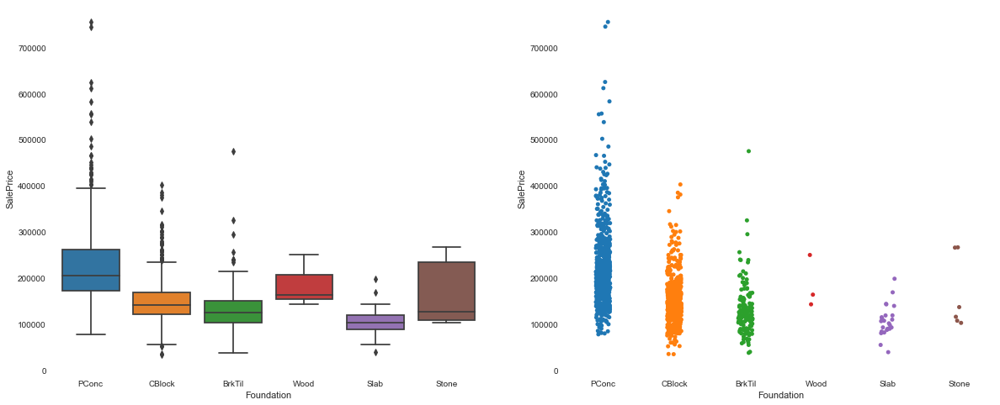

In [77]:
make_attrib_plot("Foundation",0,0)

In [78]:
# few values from Wood and Stone, so put together = Other
all_data.Foundation = all_data.Foundation.apply(lambda x: 'Other' if (x == 'Wood' or x == 'Stone') else x)

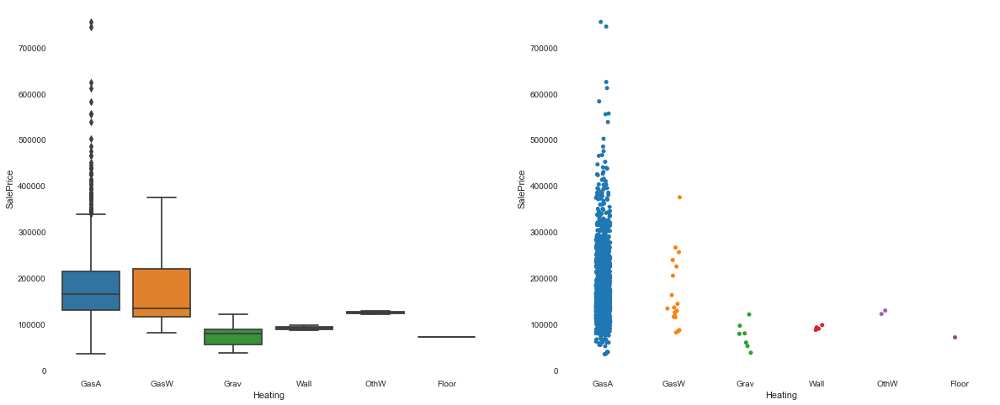

In [79]:
make_attrib_plot("Heating",0,0)

Dropping this attribute due to the majority of the data is in a single category

In [80]:
all_data.drop(['Heating'], axis=1, inplace=True)

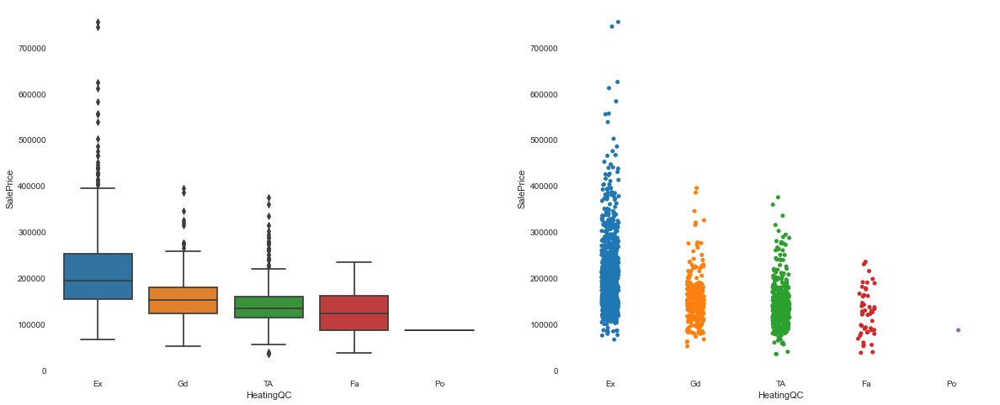

In [81]:
make_attrib_plot("HeatingQC",0,0)

In [82]:
# single value in Po, so put with Fa
all_data.HeatingQC = all_data.HeatingQC.apply(lambda x: 'Fa' if x == 'Po' else x)

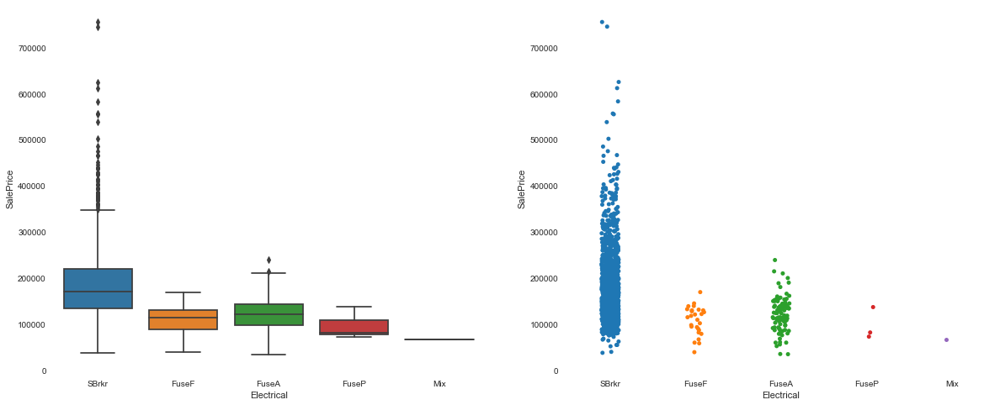

In [83]:
make_attrib_plot("Electrical",0,0)

In [84]:
# few values from FuseF to Mix, so put together = Other
all_data.Electrical = all_data.Electrical.apply(lambda x: 'Other' if (x == 'FuseA' or x == 'FuseF' or x == 'FuseP' 
                                                                      or x == 'Mix') else x)

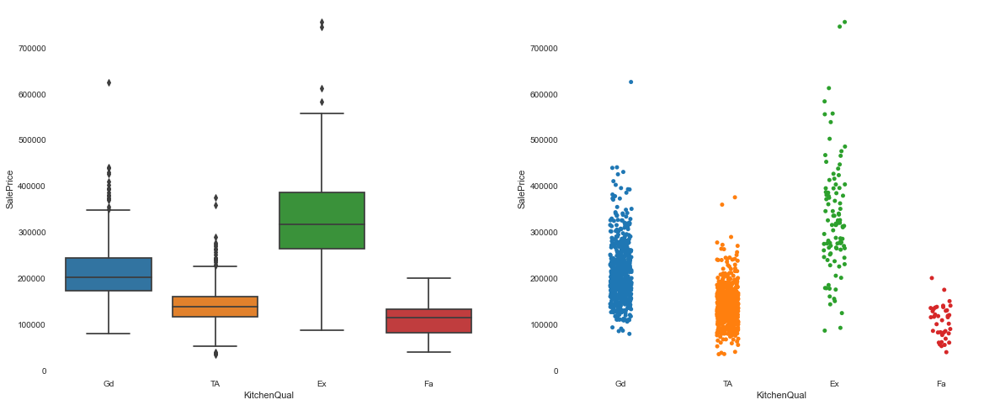

In [85]:
make_attrib_plot("KitchenQual",0,0)

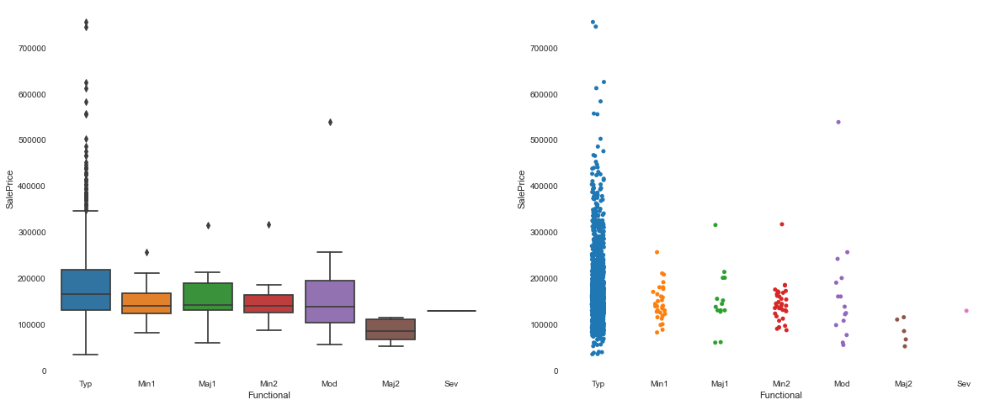

In [86]:
make_attrib_plot("Functional",0,0)

Dropping this attribute due to the majority of the data is in a single category

In [87]:
all_data.drop(['Functional'], axis=1, inplace=True)

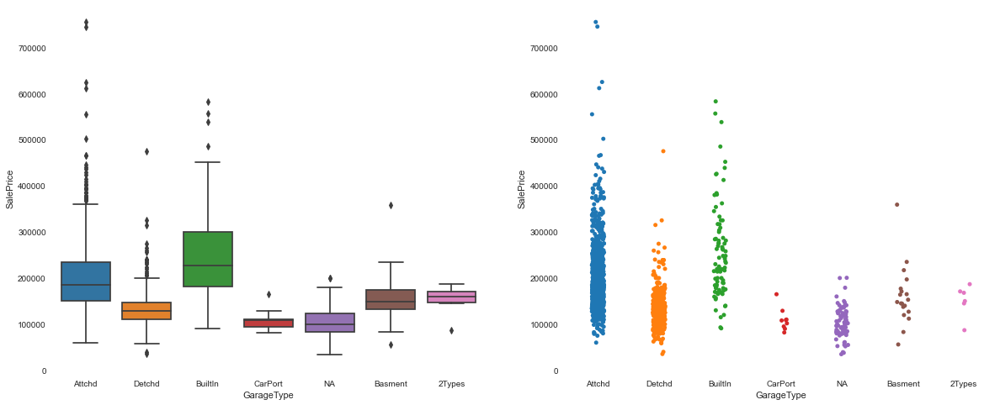

In [88]:
make_attrib_plot("GarageType",0,0)

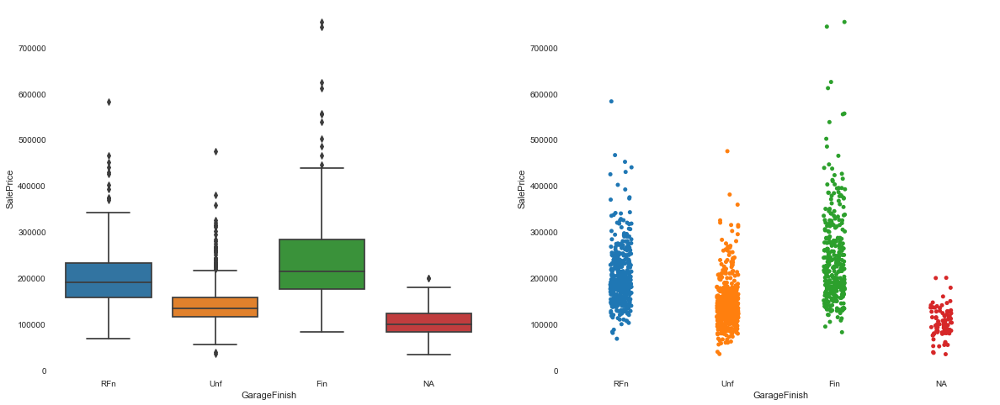

In [89]:
make_attrib_plot("GarageFinish",0,0)

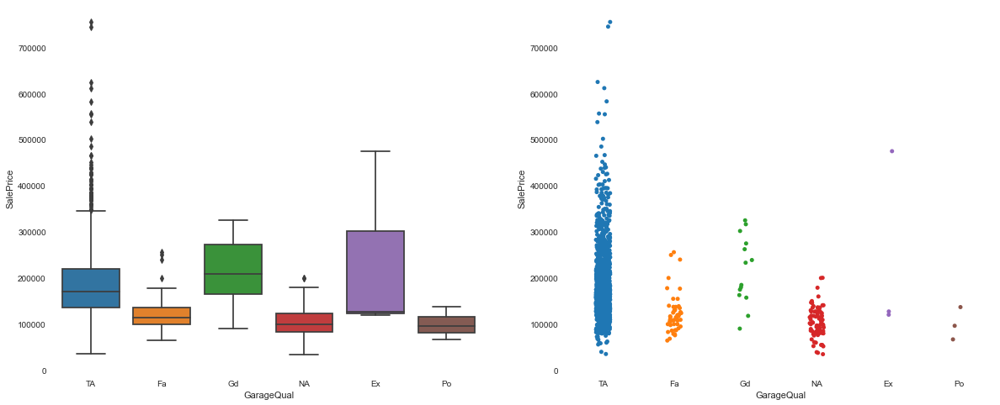

In [90]:
make_attrib_plot("GarageQual",0,0)

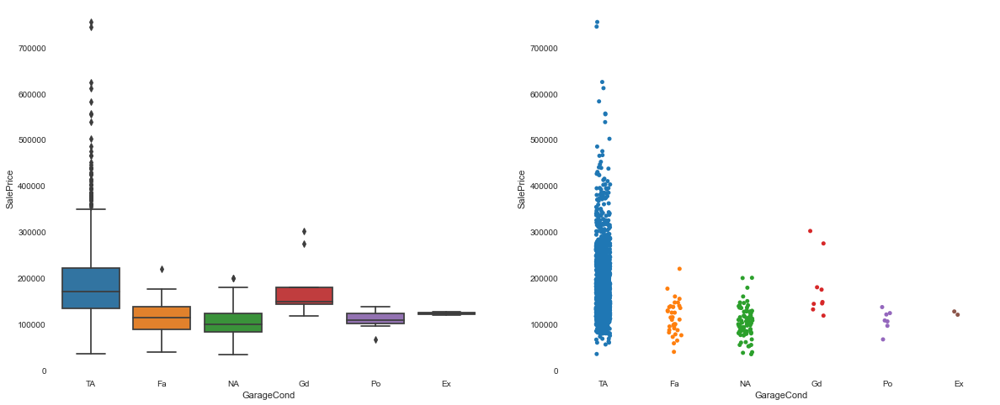

In [91]:
make_attrib_plot("GarageCond",0,0)

Dropping GarageQual and GarageCond in favour of GarageFinish

In [92]:
all_data.drop(['GarageCond'], axis=1, inplace=True)
all_data.drop(['GarageQual'], axis=1, inplace=True)

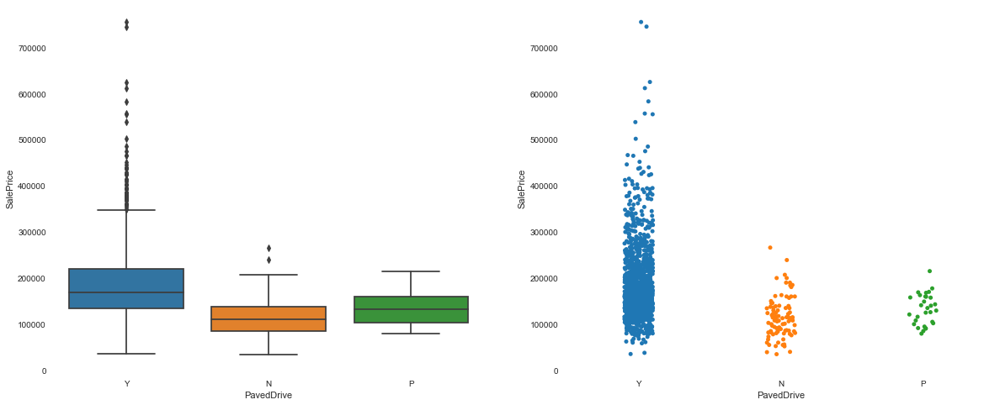

In [93]:
make_attrib_plot("PavedDrive",0,0)

In [94]:
# combining values N and P as N
all_data.PavedDrive = all_data.PavedDrive.apply(lambda x: 'N' if x == 'P' else x)

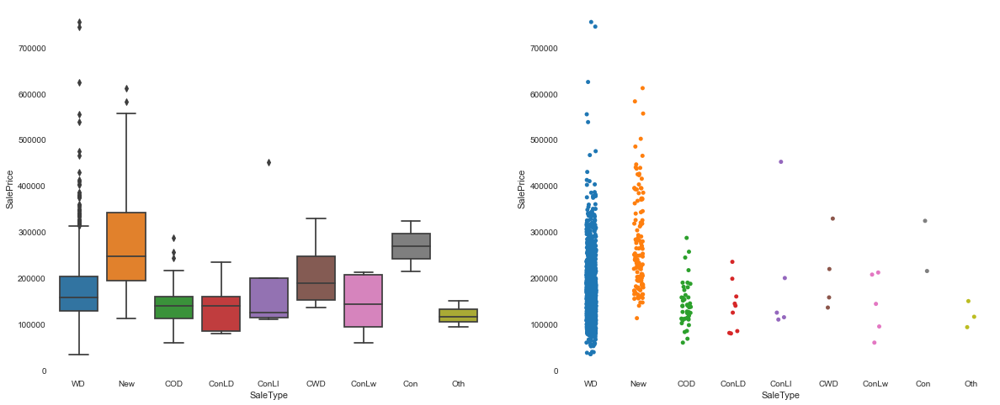

In [95]:
make_attrib_plot("SaleType",0,0)

In [96]:
# few values from ConLD to Oth, so put together = Oth
all_data.SaleType = all_data.SaleType.apply(lambda x: 'Oth' if (x == 'ConLD' or x == 'CWD' or x == 'ConLw' 
                                                                      or x == 'Con' or x == 'ConLI') else x)

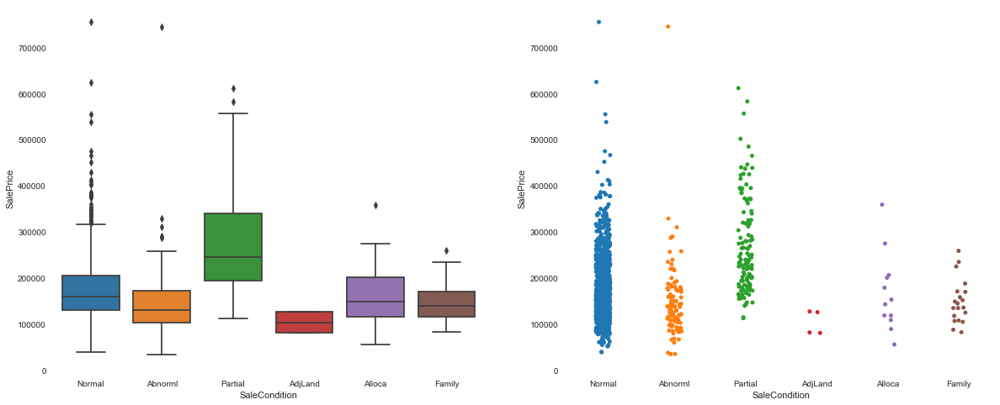

In [97]:
make_attrib_plot("SaleCondition",0,0)

In [98]:
# few values from AdjLand to Family, so put together = Oth
all_data.SaleCondition = all_data.SaleCondition.apply(lambda x: 'Other' if (x == 'AdjLand' or x == 'Alloca' or x == 'Family') 
                                                      else x)

Looking at YearBuilt and YearRemodAdd to combine into ranges (decades?)

In [99]:
all_data['YearBuilt'].describe()

count    2919.000000
mean     1971.312778
std        30.291442
min      1872.000000
25%      1953.500000
50%      1973.000000
75%      2001.000000
max      2010.000000
Name: YearBuilt, dtype: float64

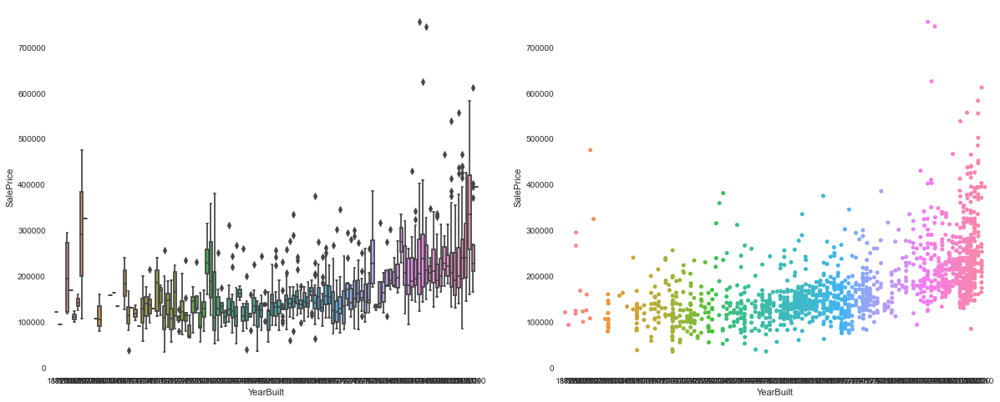

In [100]:
make_attrib_plot("YearBuilt",0,0)

In [101]:
all_data['YearBuilt'] = pd.cut(all_data['YearBuilt'], [1870, 1900, 1910, 1920, 1930, 1940, 1950, 1960 , 1970,
                                                       1980, 1990, 2000, 2010])

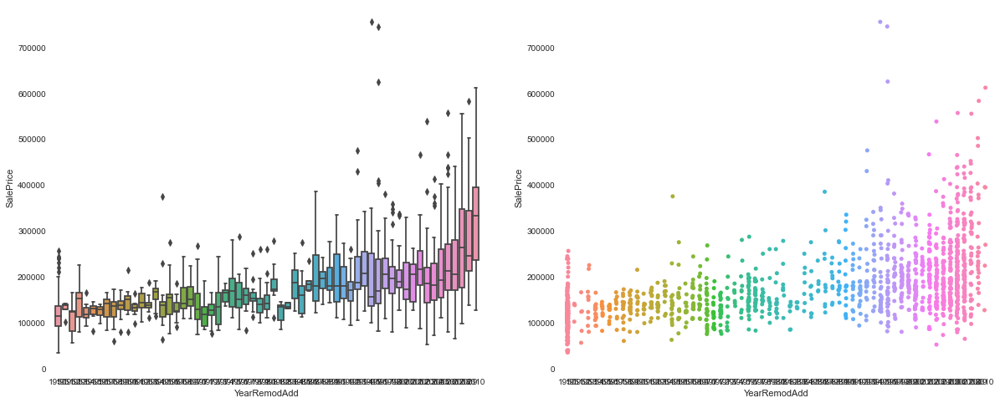

In [102]:
make_attrib_plot("YearRemodAdd",0,0)

In [103]:
all_data['YearRemodAdd'] = pd.cut(all_data['YearRemodAdd'], [1940, 1950, 1960 , 1970,
                                                       1980, 1990, 2000, 2010])

Changing MoSold and YrSold into Categorical Data

In [104]:
all_data['MoSold'] = all_data['MoSold'].astype('object')
all_data['YrSold'] = all_data['YrSold'].astype('object')

In [105]:
#plt.figure(figsize=(20,20))
#sns.countplot(data=all_data,x='YearRemodAdd')
#plt.show()

In [106]:
all_data = pd.get_dummies(all_data)

Split all_data back into train and test and add SalePrice back into training set

In [107]:
train = all_data[:ntrain]
test = all_data[ntrain:]

test.drop(['SalePrice'], axis=1, inplace=True)
train.drop(['Id'], axis=1, inplace=True)

In [108]:
train.shape

(1460, 212)

In [109]:
test.shape

(1459, 212)

Now that the train and test data are split again, looking at the correlation in the training data between attributes and the target SalePrice. Extracting all attributes that have a correlation of > 0.2

In [110]:
#corr_matrix = train.corr()

#plt.figure (figsize=(20,20))
#sns.heatmap(corr_matrix, cmap='RdYlGn', vmin=-1, annot=True)

In [111]:
# most correlated features
#corrmat = train.corr()
#top_corr_features = corrmat.index[abs(corrmat['SalePrice'])> 0.2]


In [112]:
#top_corr_features

In [113]:
#new_train = pd.DataFrame()
#new_test = pd.DataFrame()

#for col in top_corr_features:
#    new_train[col] = train[col]

#test['SalePrice'] = 0

#for col in top_corr_features:
#    new_test[col] = test[col]
    
#new_test.drop(['SalePrice'], axis=1, inplace=True)

Taking a closer look at the categorical data

In [114]:
# Get list of categorical variables
#s = (train.dtypes == 'object')
#object_cols = list(s[s].index)

#for col in object_cols:
#    sns.catplot(x=col, y='SalePrice', data=train, kind='box', aspect=2)
#    plt.title(col, weight='bold', fontsize=16)
#    plt.show()

In [115]:
#s = (train.dtypes == 'object')
#object_cols = list(s[s].index)

#new_cat_attrib = pd.DataFrame()

#for col in object_cols:
#    cat_correlation = pd.DataFrame()
#    cat_correlation[col] = train[col]
#    cat_correlation['SalePrice'] = train['SalePrice']
#    cat_correlation = pd.get_dummies(cat_correlation)
#    corr_matrix = cat_correlation.corr()
#    top_cat_features = corr_matrix.index[abs(corr_matrix['SalePrice'])>0.2]
#    new_cat_attrib [top_cat_features] = cat_correlation[top_cat_features]
    

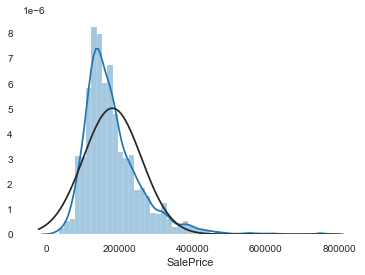

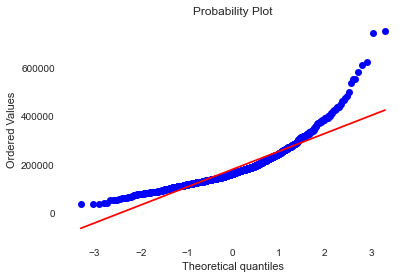

In [116]:
#histogram and normal probability plot
sns.distplot(train['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(train['SalePrice'], plot=plt)

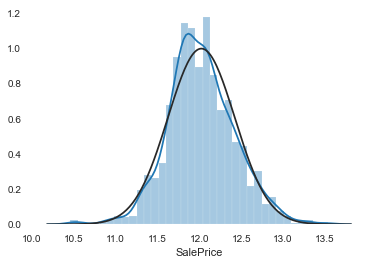

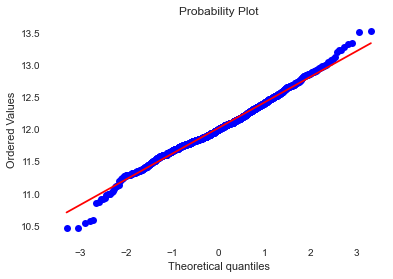

In [117]:
#applying log transformation
train['SalePrice'] = np.log1p(train['SalePrice'])

#transformed histogram and normal probability plot
sns.distplot(train['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(train['SalePrice'], plot=plt)

In [118]:
#corr_matrix = new_train.corr()

#plt.figure (figsize=(40,40))
#sns.heatmap(corr_matrix, cmap='RdYlGn', vmin=-1, annot=True)

In [119]:
#neg_Attrib = ['Has_MasonaryVeneer', 'Has_EnclosedPorch', 'BsmtExposure_No', 'BsmtQual_TA', 'CentralAir_N', 'Electrical_FuseA',
#                'Foundation_BrkTil', 'Foundation_CBlock', 'GarageFinish_Unf', 'GarageType_Detchd', 'HeatingQC_TA', 
#                'KitchenQual_Fa', 'KitchenQual_TA', 'LotShape_Reg', 'MSSubClass_30', 'MSZoning_RM', 'MasVnrType_None', 
#                'Neighborhood_Edwards', 'Neighborhood_IDOTRR', 'Neighborhood_OldTown', 'PavedDrive_N', 'SaleType_WD'
#                'ExterQual_TA', 'Exterior2nd_VinylSd', 'SaleCondition_Partial']
#neg_Attrib = ['Has_MasonaryVeneer', 'CentralAir_N', 'BsmtQual_TA', 'Electrical_FuseA', 'ExterQual_TA', 'Exterior2nd_VinylSd',
#              'Foundation_CBlock', 'KitchenQual_TA', 'LotShape_Reg', 'MSZoning_RM', 'PavedDrive_N', 'SaleCondition_Partial',
#              'SaleType_WD', 'MasVnrType_None', 'GarageType_Detchd', 'HeatingQC_TA', 'GarageFinish_Unf']
    
#for col in neg_Attrib:
#    new_train.drop(col, axis=1, inplace=True)
#    new_test.drop(col, axis=1, inplace=True)

Modelling

In [120]:
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import learning_curve

#Function to plot the learning curve of a given model

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Validation score")

    plt.legend(loc="best")
    return plt

In [121]:
#Function to display prediction accuracy scores

def training_scores(model, X, y, cv):
    predictions = cross_val_predict(model, X, y, cv=cv)

    scores = -1 * cross_val_score(model, X, y, cv=cv, scoring='neg_mean_absolute_error')
    print("MAE scores:\n", scores)
    print("\n")
    print("On average our predictions are off by about... (Average MAE scores across all experiments):")
    print(scores.mean())
    print("\n")
    accuracy = metrics.r2_score(y, predictions)*100
    print ('Cross-Predicted Accuracy:', accuracy ,'%')

In [122]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#Select the prediction target and store in y using dot notation
y = train.SalePrice

#Select all remaining attributes except for SalePrice and store in X
X = train.drop('SalePrice',1)

#Scale data
#scaler = StandardScaler().fit(X)
#scaler = MinMaxScaler().fit(X)
#scaledX = scaler.transform(X)

#imputed_X = pd.DataFrame(scaledX)
#imputed_X.columns = X.columns


In [123]:
from sklearn.ensemble import GradientBoostingRegressor

#gbr = GradientBoostingRegressor(learning_rate = 0.1, max_depth= 4, max_features= 5, min_samples_leaf= 1, 
#                                min_samples_split= 2, subsample = 1.0, n_estimators = 250)

gbr = GradientBoostingRegressor(learning_rate = 0.1, max_depth= 5, max_features= 20, min_samples_leaf= 4, 
                                min_samples_split= 3, subsample = 1.0, n_estimators = 250, random_state=1)

gbr.fit(X,y)

training_scores (gbr, X, y, 10)

MAE scores:
 [0.07777912 0.07744435 0.08368414 0.09650091 0.10381766 0.07545566
 0.08182642 0.0803485  0.08470068 0.08467805]


On average our predictions are off by about... (Average MAE scores across all experiments):
0.08462354881959702


Cross-Predicted Accuracy: 90.630213118855 %


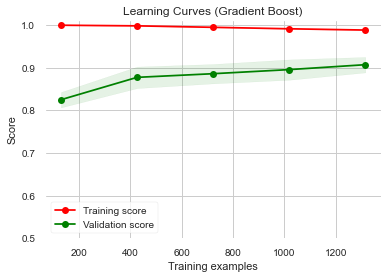

In [124]:
# Plot learning curves
title = "Learning Curves (Gradient Boost)"
cv = 10
plot_learning_curve(gbr, title, X, y, ylim=(0.5, 1.01), cv=cv, n_jobs=1);

In [125]:
from sklearn import linear_model

rcv = linear_model.RidgeCV(cv=10)

rcv.fit(X,y)

training_scores (rcv, X, y, 10)

MAE scores:
 [0.08629803 0.07592562 0.08289127 0.09188771 0.09690492 0.07364394
 0.08604521 0.07726965 0.09261622 0.08373125]


On average our predictions are off by about... (Average MAE scores across all experiments):
0.08472138355548037


Cross-Predicted Accuracy: 89.91224170882528 %


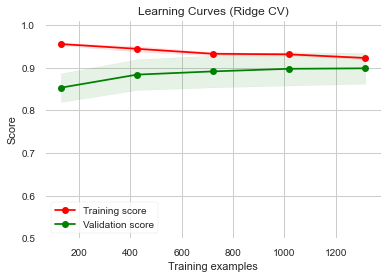

In [126]:
# Plot learning curves
title = "Learning Curves (Ridge CV)"
cv = 10
plot_learning_curve(rcv, title, X, y, ylim=(0.5, 1.01), cv=cv, n_jobs=1);

In [127]:
from sklearn.ensemble import ExtraTreesRegressor

extraTree = ExtraTreesRegressor(random_state=1)

extraTree.fit(X,y)

training_scores(extraTree, X, y, 10)

MAE scores:
 [0.09077331 0.0842167  0.09256066 0.10016553 0.12096242 0.07832319
 0.08547091 0.0935532  0.09281431 0.10570893]


On average our predictions are off by about... (Average MAE scores across all experiments):
0.09445491500555589


Cross-Predicted Accuracy: 88.02973785142507 %


In [128]:
#from sklearn.model_selection import GridSearchCV

#param_grid = [{
#    'learning_rate': (0.05, 0.1 ,0.2),
#    'max_features': (30, 35, 40),
#    'min_samples_split': (2, 3, 4),
#    'min_samples_leaf': (2, 4, 6),
#    'max_depth': (3, 5, 7),
#    'n_estimators': (100, 250, 500)
#}]
#grid_search = GridSearchCV(gbr, param_grid,cv=10, scoring='neg_mean_absolute_error')
#grid_search.fit(X,y)
#grid_search.best_params_

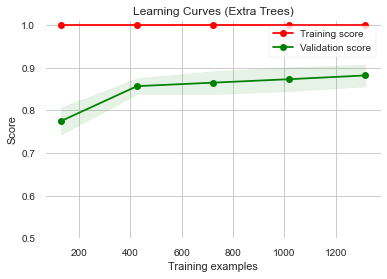

In [129]:
# Plot learning curves
title = "Learning Curves (Extra Trees)"
cv = 10
plot_learning_curve(extraTree, title, X, y, ylim=(0.5, 1.01), cv=cv, n_jobs=1);

In [130]:
from sklearn.ensemble import RandomForestRegressor
forest_model = RandomForestRegressor(random_state=1)

forest_model.fit(X,y)

training_scores (forest_model, X, y, 10)

MAE scores:
 [0.09883823 0.08842615 0.099445   0.09805979 0.11038504 0.08129759
 0.09383455 0.09527048 0.09233125 0.10404658]


On average our predictions are off by about... (Average MAE scores across all experiments):
0.09619346532083124


Cross-Predicted Accuracy: 87.62502620663743 %


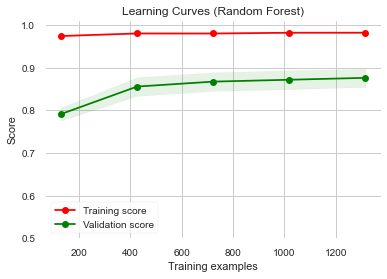

In [131]:
# Plot learning curves
title = "Learning Curves (Random Forest)"
cv = 10
plot_learning_curve(forest_model, title, X, y, ylim=(0.5, 1.01), cv=cv, n_jobs=1);

In [132]:
Pred_Final = test.drop('Id',1)
#Pred_Final = new_test

gbr.fit(X, y)

pred = rcv.predict(Pred_Final)

submission = pd.DataFrame({'Id':test['Id'],'SalePrice':pred})

submission['SalePrice'] = np.expm1(submission['SalePrice'])

submission.head()

,Id,SalePrice
1460,1461,116320.314589
1461,1462,156276.210452
1462,1463,173004.062164
1463,1464,201137.165967
1464,1465,205532.529336


In [133]:
submission['Id'] = submission['Id'].astype('int64')

#creating submission file
filename = 'House Prices Prediction.csv'

submission.to_csv(filename, index=False)
print('Saved file: ' + filename)

Saved file: House Prices Prediction.csv


In [134]:
#import eli5
#from eli5.sklearn import PermutationImportance

#perm = PermutationImportance(rcv, random_state=1).fit(X,y)
#eli5.show_weights(perm, feature_names = X.columns.tolist())